In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns
import requests
import os
from tqdm import tqdm
import json
import re

from functools import reduce

In [2]:
import jieba
from wordcloud import WordCloud

# Are Data-related jobs really popular in Taiwan?

In [17]:
# Now we will create a class to enable plotting radar charts
import plotly.graph_objects as go
import plotly.offline as pyo
import plotly.express as px
from plotly.subplots import make_subplots


# We will create a class to polar plots because we are going to apply the same settings
# for multiple charts. By creating a class we can standardize that and change configs in only one place.
class PolarPlot():

    def __init__(self, title):
        pyo.init_notebook_mode() # allows plotly to show charts on notebook 
        self.figure = go.Figure() # instatiates plotly figure
        self.range = (0, 0) # define the initial range of polar plots
        self.title = title # Saves the chart title as an attribute
        self.theta = list(set(df['job_type']))
        self.theta.append(self.theta[0])
        #['AI/ML Engineer', 'Business Analyst', 'Data Engineer', 'Data Scientist', 'Software Engineer', 'Researcher'] # Those are the Theta values for our plot
    
    def update_common_layout(self):
        """
        Updates general layout characteristics
        """
        self.figure.update_layout(
            showlegend = True,
            title_text = self.title, # add title to chart from attribute
            title_font_color = '#333333', # Grey is always better to not draw much attention
            title_font_size = 10,
            legend_font_color = 'grey', # We don't want to draw attention to the legend 
            legend_itemclick = 'toggleothers', # Change the default behaviour, when click select only that trace
            legend_itemdoubleclick = 'toggle', # Change the default behaviour, when double click ommit that trace
            width = 800, # chart size 
            height = 500 # chart size
        )
        
    def update_commom_polar_layout(self):
        """
        Updates polar layout characteristics
        """
        self.figure.update_layout(

            # White background is always better
            polar_bgcolor='white', 

            # we want to show the axis
            polar_radialaxis_visible=True, 

             # we want to show the axis titles
            polar_radialaxis_showticklabels=True,

            # grey to the axis label (Software Engineer, Data Scientist, etc)
            polar_radialaxis_tickfont_color='darkgrey', 

            # Always grey for all elements that are not important
            polar_angularaxis_color='grey', 

            # hide lines that are not necessary
            polar_angularaxis_showline=False,

            # hide lines that are not necessary 
            polar_radialaxis_showline=False, 

             # show the axis bellow all traces
            polar_radialaxis_layer='below traces',

            # grey to not draw attention
            polar_radialaxis_gridcolor='#F2F2F2',

            # gets the range attribute, that is calculated in another method 
            polar_radialaxis_range=self.range 
        )
        
    def add_data(self, data, industry, color, hover_template='%{r:0.0f}%'):
        """
        Adds a trace to the figure following the same standard for each trace
        """

        # We only want to highlight a few traces, this will decide if a trace is highlighted or not
        highlight = color != 'lightslategrey' 

         # add the first element to the end of the list, this will "close" the polar chart 
        data.append(data[0])
        
        self.figure.add_trace(
           
            go.Scatterpolar(

                # Data points 
                r=data,

                # Axis (Software Engineer, Data Scientist, etc)
                theta=self.theta,

                # plot mode to lines (not good to show markers, it usually adds cluttering to chart) 
                mode='lines', 

                # name to be exibited on legend and on hover
                name=industry, 
                
                # what to show on hover (name + data point)
                hoverinfo='name+r', 

                # Format of data point
                hovertemplate=hover_template, 

                 # line color
                line_color=color,

                # will decide if show or not the legend, only shows if color != lightslategrey. 
                # Otherwise we would have one legend for each trace. Too much clutter.
                showlegend=highlight, 

                 # If we want to highlight, then oppacity is 0.8. Otherwise it is 0.25, to reduce clutter.
                opacity= 0.8 if highlight else 0.25,

                # This will allow smoothing the lines
                line_shape='spline',

                # How much the lines will smooth 
                line_smoothing=0.8, 

                # we want highlighted traces to be more evident, otherwise they should stay in the background 
                line_width=1.6 if highlight else 0.6 
            )
        )
        # Calls the method that will update the max range
        self.update_range(data) 
    
    def update_range(self, data):
        """
        Updates the range to be 110% of maximum value of all traces
        """
        max_range = max(data) * 1.1
        self.range = (0, max_range) if max_range > self.range[1] else self.range # updates the range attribute
        
    def show(self):
        """
        Update layouts and shows the figure
        """
        self.update_common_layout() 
        self.update_commom_polar_layout()
        self.figure.show()

In [77]:
class JobTitlebyIndustry:
    
    def __init__(self, industry_color, polar_plot, upper_level = True):

        # Choose level type
        self.upper_level = upper_level

        # defines the list of industries as all industries available on Kaggle dataset
        if upper_level:
            self.industries = list(set(company['公司類別(大)'].tolist())) 
        else:
            self.industries = list(set(company['公司類別(小)'].tolist())) 

        # defines a pd.Series of job types for later use
        ###self.job_types = pd.DataFrame(list(set(df['job_type'])), columns = ['job_type'])

        # It is a dictionary of industry names and colors
        self.industry_color = industry_color 

        # PolarPlot() instance that we have defined before
        self.polar = polar_plot

        # Try This One
        self.job_types = pd.DataFrame(self.polar.theta[:-1], columns = ['job_type'])
        
        for industry in self.industry_color.keys():
            # Here we remove industries that will be highlighted and add then back to the end of the list
            # this way we avoid having non highlighted traces over them
            self.industries.remove(industry)

            self.industries.append(industry)
    
    def add_traces_percentage(self, data):

        """
        Calculates the percentage of rows for each job title in each industry  and then add it to plot
        """

        # iterates in the list of industries
        for industry in self.industries:

            # filters data for a single industry
            if  self.upper_level:
                data_filtered = data[data['公司類別(大)'] == industry]
            else:
                data_filtered = data[data['公司類別(小)'] == industry]
            
            # only plotting if there are more than 20 datapoints
            if len(data_filtered) > 5: 
                
                # check if industry is in the dict of industries and get color, if it is not then color is lightslategrey
                color = self.industry_color.get(industry, 'lightslategrey') 

                # group the data by job_type, perform count and convert it to a list 
                plot_data = data_filtered.groupby(['job_type'], as_index=False)['工作代碼'].count() #['工作代碼'].tolist() 
                
                plot_data = pd.merge(self.job_types, plot_data, how = 'left').fillna(0)['工作代碼'].tolist()

                # Transform absolute values into percentages
                plot_data = (np.array(plot_data) / sum(plot_data) * 100).tolist() 

                plot_data.append(plot_data[0])
                # add trace to the figure
                self.polar.add_data(plot_data, industry, color) 
    

    def add_traces_average_salary(self, data):

        """
        Calculates the average salary for each job title in each industry and then add it to plot
        """

        for industry in self.industries:
            
            if  self.upper_level:
                data_filtered = data[data['公司類別(大)'] == industry]
            else:
                data_filtered = data[data['公司類別(小)'] == industry]
            
            # only plotting if there are more than 20 datapoints
            if len(data_filtered) > 5: 
                color = self.industry_color.get(industry, 'lightslategrey')

                # Group by job title and calculate average salary
                plot_data = data_filtered.groupby(['job_type'], as_index=False)['Salary'].mean() 
                plot_data = pd.merge(self.job_types, plot_data, how = 'left').fillna(0)['Salary'].tolist()

                # add trace to figure
                self.polar.add_data(plot_data, industry, color, 'NT$%{r:.2r}') #, '$%{r:.2r}' 
          

    def add_trace_labor_demand(self, data):
        """
        Calculates the overall labor demand for each job title in each industry and then add it to plot
        """
        for industry in self.industries:

            if  self.upper_level:
                data_filtered = data[data['公司類別(大)'] == industry]
            else:
                data_filtered = data[data['公司類別(小)'] == industry]       

            if len(data_filtered) > 5: 
                color = self.industry_color.get(industry, 'lightslategrey')

                # Group by job title and calculate average salary
                plot_data = data_filtered.groupby(['job_type'], as_index=False)['labor_demand'].sum() 
                plot_data = pd.merge(self.job_types, plot_data, how = 'left').fillna(0)['labor_demand'].tolist()

                # add trace to figure
                self.polar.add_data(plot_data, industry, color, '%{r:.2r}人') #, '$%{r:.2r}' 



    def adjust_layout_percentage(self):
        """
        Adjust layout to show percentages
        """

        self.polar.figure.update_layout(
            polar_radialaxis_tickvals=[25, 50, 75], # show ticks ate 25, 50 and 75
            polar_radialaxis_ticktext=['25%', '50%', '75%'],
            polar_radialaxis_tickmode='array',
        )

In [5]:
# Text processing functions

def load_stopwords():
    stopWords = []
    with open('stop_words.txt', 'r', encoding='UTF-8') as file:
        for data in file.readlines():
            data = data.strip()
            stopWords.append(data)    
    return stopWords

def create_words(series):
    stopWords = load_stopwords()
    
    series = series.fillna(' ')
    res = ''
    for row in series:
        res += row
    
    segment = jieba.cut(res, cut_all=False)
    remainderWords = list(filter(
        lambda a: a not in stopWords and a != '\n' and a!='資料' and a!='數據' and a!='分析' and a!='系統', segment
        ))
    return '.'.join(remainderWords)


def create_words_for_other_conditions(series):
    stopWords = load_stopwords()
    
    series = series.fillna(' ')
    res = ''
    for row in series:
        res += row
    
    segment = jieba.cut(res, cut_all=False)
    remainderWords = list(filter(
        lambda a: a not in stopWords and a != '\n' and a!='資料' and a!='數據' and a!='分析' and a!='系統', segment
        ))
    return '.'.join(remainderWords)


def create_segment(data):
    stopWords = load_stopwords()

    series = series.fillna(' ')


References:
* [Is there any job out there? Kaggle vs Glassdoor](https://www.kaggle.com/andresionek/is-there-any-job-out-there-kaggle-vs-glassdoor)
* [A story told through a heatmap](https://www.kaggle.com/tkubacka/a-story-told-through-a-heatmap)
* [Exploring PhD Community with Network Analysis](https://www.kaggle.com/artvolgin/exploring-phd-community-with-network-analysis)

### 
我想要看各產業需要的人才長什麼樣子
* 職缺：data scientist/ data analyst / business analyst / researcher / software engineer / data engineer
1. 分類職缺 --> condition searching
2. 職缺

In [6]:
# Load Data 
list_data = os.listdir('Dataset/')
list_job_data = [x for x in list_data if 'job' in x]
list_company_data = [x for x in list_data if 'company' in x]

job_data = [pd.read_csv("Dataset/" + x) for x in list_job_data]
company_data = [pd.read_csv("Dataset/" + x) for x in list_company_data]

job = reduce(lambda x,y: pd.concat([x,y], axis = 0), job_data).drop_duplicates()
company = reduce(lambda x,y: pd.concat([x,y], axis = 0), company_data).drop_duplicates()

### 1. Define job type

In [7]:
job['job_type'] = 'Others'

job.loc[job['工作名稱'].map(lambda x: ('軟體' in x) | ('工程師' in x) ), 'job_type'] = 'Software Engineer'

job.loc[job['工作名稱'].map(lambda x: ('工程師' in x) & ('數據' in x)|('SQL' in x)), 'job_type'] = 'Data Engineer'

job.loc[
    job['工作名稱'].map(
        lambda x: ('商業' in x)|('Business' in x)|('BI' in x)|('Business' in x)|('Analytics' in x) #('分析' in x)|
        |('intelligence' in x) & ('工程師' not in x)), 'job_type'] = 'Business Analyst/Intelligence'

job.loc[job['工作名稱'].map(lambda x: ('科學家' in x)|('Scientist' in x)|('科學' in x) & ('工程師' not in x)), 'job_type'] = 'Data Scientist'

job.loc[job['工作名稱'].map(lambda x: ('機器' in x)|('人工智慧' in x)|('machine' in x)|('NLP' in x)|('自然語言' in x)|('AI' in x)&('工程師' in x)), 'job_type'] = 'AI/ML Engineer'

job.loc[job['工作名稱'].map(lambda x: ('研究員' in x)|('統計' in x)|('statistics' in x) ), 'job_type'] = 'Researcher'

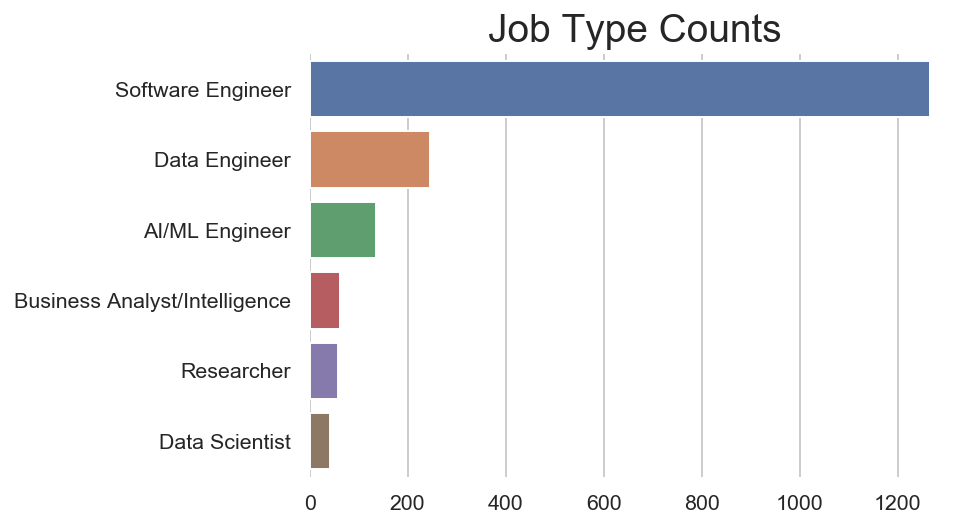

In [8]:
sns.set(style="whitegrid")
f,ax = plt.subplots(figsize=(6, 4), dpi = 140)

job_type_counts = job['job_type'].value_counts().reset_index().iloc[1:]

sns.barplot(x="job_type", y="index", data=job_type_counts) #color='lightgrey'

sns.despine(left=True, bottom=True)

ax.xaxis.set_label_text("")
ax.yaxis.set_label_text("")
_ = ax.set_title('Job Type Counts', fontsize=20)

In [9]:
list_job_type = list(job['job_type'].unique())[1:] # drop out job_type == `others`
list_job_type

['Software Engineer',
 'Data Scientist',
 'Data Engineer',
 'Researcher',
 'Business Analyst/Intelligence',
 'AI/ML Engineer']

In [105]:
job

,公司代碼,工作代碼,工作名稱,工資待遇,工資待遇(最低),工資待遇(最高),工作性質,工作敘述,需求人數,經驗要求,...,擅長工具,工作技能,其他條件,應徵人數,經度,緯度,job_type,Salary,pay_type,labor_demand
0,b7j4cx4,6q2o4,遊戲機率企劃(PM),"月薪40,000元以上",40000,9999999,遊戲企劃人員/產品企劃開發人員,1. 負責遊戲企劃提案及執行開發\n2. 進行遊戲機率模組設計及驗證\n3. 視專案需求進行...,1~2人,1年以上,...,NaN,NaN,1. 熟悉Excel操作者佳 2. 具獨立思考能力者佳 3. 具備邏輯概念佳 4. 對...,11~30人應徵,120.683020,24.159461,Others,40000.0,1,2.0
1,amb3eog,677z4,【巧連智】系統專案管理人員,"月薪25,000~40,000元",25000,40000,資料庫管理人員,1. 專案管理與相關事務協調、委外廠商管理、文件與SOP建立/2. 使用者需求規劃、系統架構...,1人,1年以上,...,Excel/PowerPoint/Word,NaN,"●善長Office軟體操作, 熟Excel樞紐分析及函數運用、具資料庫、SQL、T-SQL ...",6~10人應徵,121.515154,25.044898,Others,32500.0,1,1.0
2,1a2x6bjyr9,5df6t,PHP軟體開發工程師,"月薪40,000~65,000元",40000,65000,Internet程式設計師/軟體設計工程師,Applicant must be a graduate of Computer Scien...,1~5人,3年以上,...,NaN,NaN,NaN,0~5人應徵,121.574779,25.035931,Software Engineer,52500.0,1,5.0
3,1a2x6bklkm,6c806,iOS軟體開發工程師,待遇面議,0,0,軟體設計工程師,徵求條件：\n- 精通 iOS 程式設計，能獨立完成模組設計和研發，至少3年 iOS 開發經...,3~4人,3年以上,...,iOS/SWIFT/Objective-C,NaN,NaN,11~30人應徵,121.564472,25.033964,Software Engineer,47500.0,1,4.0
4,1a2x6bksif,72bhm,Android開發工程師 Android Developer,待遇面議,0,0,軟體設計工程師/Internet程式設計師/通訊軟體工程師,*負責公司Android APP開發及更新維護。\n\n工作說明：\n\n1. 負責專案An...,2~3人,3年以上,...,Android/Java/JavaScript/HTTP/TCP/IP,系統架構規劃/系統維護操作/系統整合分析/軟體工程系統開發/軟體品質與保證/軟體程式設計/網...,1. 3年以上Android APP開發經驗。 2. 曾有金融軟體開發經驗或熟悉區塊鏈技術佳...,0~5人應徵,121.579084,25.049267,Software Engineer,47500.0,1,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3005,8098yco,74g1z,行政助理秘書,"月薪25,000~28,000元",25000,28000,行政助理/秘書,1.\t處理主管交辦相關行政事務\n2.\t文書資料處理及歸檔保存作業\n3.\t公司內部交...,1人,1年以上,...,Windows 7/Excel/PowerPoint/Word/中文打字50~75/英文打字...,文書處理╱排版能力/行政事務處理/報表彙整與管理/電話接聽與人員接待事項/文件或資料輸入建檔...,1. 1-2年工作經驗以上 2. 具醫管相關科系畢 佳 3. 熟悉電腦文書作業，有文書處理相...,6~10人應徵,121.459929,25.001931,Others,26500.0,1,1.0
3006,aip54gw,6zqip,行政助理-台北市中山區 (清潔事業處),"月薪26,000~30,000元",26000,30000,行政助理/行政人員/業務助理,1.負責公司文件檔案的建立及歸檔工作\n2.負責事業單位之例行帳務作業及相關工作\n3.負責...,1人,不拘,...,Excel/Word/中文打字20~50/英文打字20~50/鼎新,文件收發與檔案管理/文書處理╱排版能力/文件或資料輸入建檔處理/結帳作業與帳務處理,有鼎新Workflow ERP經驗尤佳,11~30人應徵,121.543719,25.049399,Others,28000.0,1,1.0
3007,15bw25ls,31gut,資深人資專員,待遇面議,0,0,人力資源人員/人力資源助理,1. 人資部相關事務及集團薪資、獎金計算暨發放作業 。 \n\n2. 各項保險作業(勞、健、...,1~2人,3年以上,...,Excel/Internet Explorer/PowerPoint/Word/鼎新,具備人力資源相關知識/行政事務處理/文件或資料輸入建檔處理/勞工保險相關法規,"熟鼎新ERP系統者,優先錄用 抗壓性高、邏輯性強，需獨立作業",11~30人應徵,121.550560,25.039077,Others,47500.0,1,2.0
3008,bjtsf80,71gwf,資訊系統工程師(程式設計),"月薪32,000元以上",32000,9999999,軟體設計工程師/資訊助理人員/系統維護／操作人員,協助客戶導入資訊管理系統 (Micro Focus Service Manager)\n1....,1~2人,不拘,...,C#/Visual Basic/MS SQL/Tomcat/JavaScript,作業系統基本操作/系統整合分析/軟體程式設計/資料庫系統管理維護/資料庫軟體應用,1. 不排斥寫程式、喜歡在程式上日益精進。 2. 對於資料庫需要有一定的了解程度。 3. 了...,0~5人應徵,121.569530,25.080536,Software Engineer,32000.0,1,2.0


### 2. Salary

In [97]:
job['Salary'] = job['工資待遇'].map(lambda x: x.replace(',',''))

# 取出工資，把『待遇面議』、『40,000以上』用工資高於40,000的職位薪資中位數去填（法規規定低於40,000得載明薪資）
job['Salary'] = job['Salary'].map(lambda x: re.findall(r"[0-9]+", x)).map(lambda x: np.mean([int(y) for y in x]))
salary_median = job.query('Salary>=40000')['Salary'].median()
job['Salary'].fillna(salary_median, inplace = True)

# 標準化薪資為月薪
job['pay_type'] = job['工資待遇'].map(lambda x: 1 if '月' in x else 12 if '年' in x else 1)
job['Salary'] = job['Salary']/job['pay_type']

#job['Salary'] = job['Salary'].clip(0,200000)

In [98]:
job['Salary'].describe()

count      5111.000000
mean      41742.008837
std       14935.597031
min         125.000000
25%       32500.000000
50%       44000.000000
75%       47500.000000
max      311900.000000
Name: Salary, dtype: float64

### Required # of employee

In [99]:
# 取出「需求人數」，若寫『不限』則用 q90 去填

job['labor_demand'] = job['需求人數'].\
    map(lambda x: re.findall(r"[0-9]+", x)).\
    map(lambda x: list(map(int, x)) if len(x)>0 else [np.NaN]).\
    map(lambda x: np.max(x))

ld_q90 = np.quantile(job['labor_demand'], q=.90)
job['labor_demand'].fillna(ld_q90, inplace = True)

In [100]:
job['labor_demand'].describe(np.linspace(0,1,11))

count    4810.000000
mean        1.829522
std         1.957662
min         1.000000
0%          1.000000
10%         1.000000
20%         1.000000
30%         1.000000
40%         1.000000
50%         1.000000
60%         2.000000
70%         2.000000
80%         2.000000
90%         3.000000
100%       60.000000
max        60.000000
Name: labor_demand, dtype: float64

# 1. Word Cloud
## 1.1 工作敘述

In [12]:
list_job_type = list(set(job['job_type']))
list_job_type = [x for x in list_job_type if x != 'Others']

Building prefix dict from the default dictionary ...
Loading model from cache /var/folders/9x/z3ybk6ps1_936yd3nx3qxlqw0000gq/T/jieba.cache
Loading model cost 0.864 seconds.
Prefix dict has been built successfully.


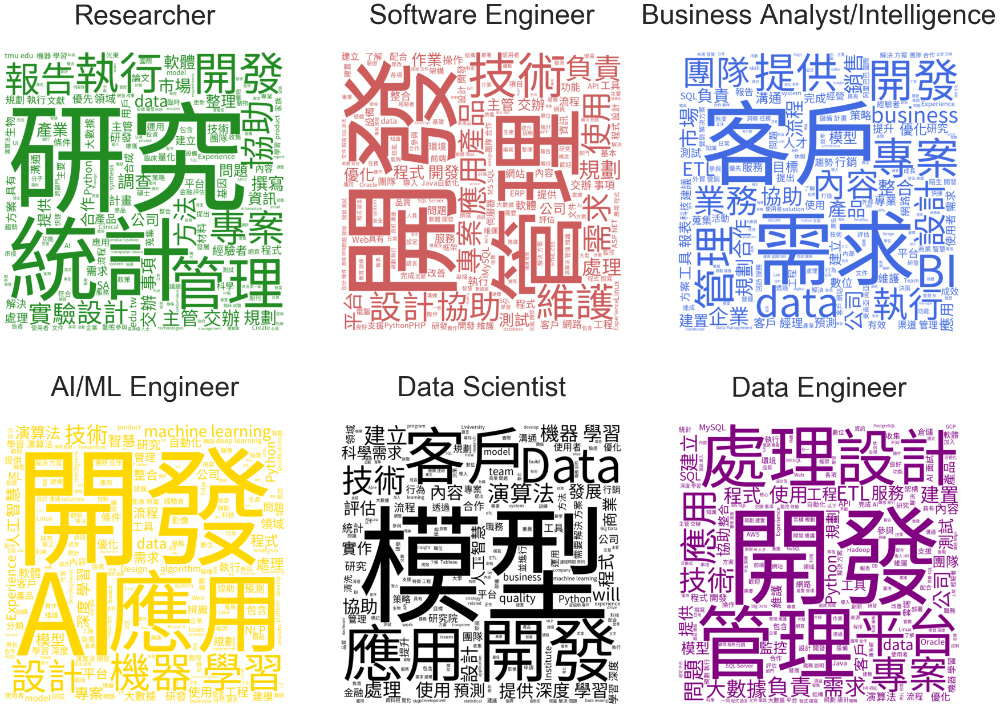

In [13]:
fig = plt.figure()
fig.set_size_inches(30, 22)
font = 'SourceHanSansTW-Regular.otf'

colors_set = ['forestgreen', 'indianred', 'royalblue', 'gold','black','purple']
for i in range(len(list_job_type)):
    job_type_description = job[job.job_type == list_job_type[i]]['工作敘述']
    text = create_words(job_type_description)

    ax = fig.add_subplot(2,3, i+1)

    my_wordcloud = WordCloud(
        width = 1200, height = 1200, background_color="white", font_path = font,
        color_func=lambda *args, **kwargs: colors_set[i]).generate(text)
    
    ax.imshow(my_wordcloud, interpolation = 'bilinear')
    ax.axis('off')
    ax.set_title(list_job_type[i], size=48, pad=50)
    


## 1.2 其他條件

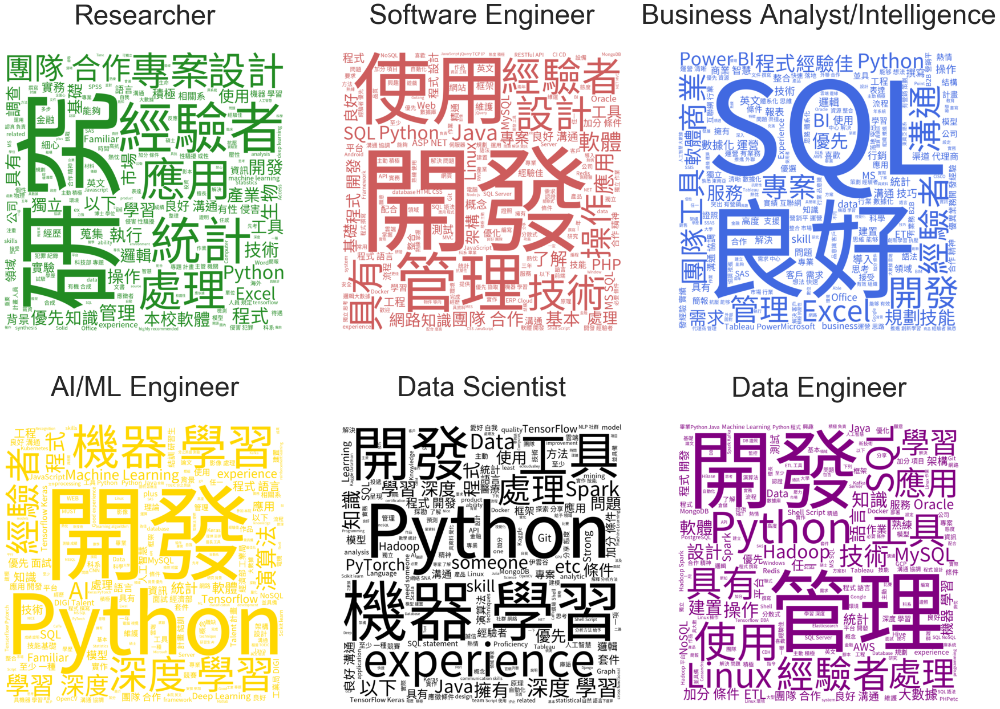

In [14]:
fig = plt.figure()
fig.set_size_inches(30, 22)

colors_set = ['forestgreen', 'indianred', 'royalblue', 'gold','black','purple']
for i in range(len(list_job_type)):
    job_type_description = job[job.job_type == list_job_type[i]]['其他條件']
    text = create_words(job_type_description)

    ax = fig.add_subplot(2,3, i+1)

    my_wordcloud = WordCloud(
        width = 1200, height = 1200, background_color="white", font_path = font,
        color_func=lambda *args, **kwargs: colors_set[i]).generate(text)
    
    ax.imshow(my_wordcloud, interpolation = 'bilinear')
    ax.axis('off')
    ax.set_title(list_job_type[i], size=48, pad=50)

# PairPlot

In [101]:
df = pd.merge(job, company, on = '公司代碼', how = 'outer')
df = df[~(df['job_type'].isin(['Others','Software Engineer']))]
#df = df[df.Salary > 20000]
df.columns

Index(['公司代碼', '工作代碼', '工作名稱', '工資待遇', '工資待遇(最低)', '工資待遇(最高)', '工作性質', '工作敘述',
       '需求人數', '經驗要求', '學歷要求', '科系要求', '語文條件', '語言能力', '擅長工具', '工作技能', '其他條件',
       '應徵人數', '經度', '緯度', 'job_type', 'Salary', 'pay_type', 'labor_demand',
       '公司名稱', '公司類別(大)', '公司類別(小)', '公司人數', '公司資本額'],
      dtype='object')

In [102]:
pp = PolarPlot('大部分產業徵才主要以資料工程師 (data engineer)為主，金融業與網際網路產業較傾向尋找BA/BI人才，而半導體產業更focus在找 AI/ML Engineer' \
'<br><span style="font-size:8px"><i>各產業領域徵才比例 (%)</span></i>')
# 大部分企業在徵才方面主要還是以資料工程師 (data engineer)為主，金融業與網際網路產業較傾向尋找BA/BI人才，而半導體產業的徵才取向更focus在 AI/ML Engineer


br_in_color = {
    #'電腦軟體服務業':'forestgreen',
    '網際網路相關業':'#002366',
    #'電腦系統整合服務業':'royalblue',
    '銀行業':'#ED2124',
    #'廣告行銷公關業':'gold',
    '半導體製造業':'gold'
}

plot = JobTitlebyIndustry(br_in_color, pp)
plot.add_traces_percentage(df)
plot.adjust_layout_percentage()
plot.polar.show()

In [103]:
pp = PolarPlot('大部分產業徵才主要以資料工程師 (data engineer)為主，金融業與網際網路產業較傾向尋找BA/BI人才，而半導體產業更focus在找 AI/ML Engineer' \
'<br><span style="font-size:8px"><i>各產業領域徵才比例 (%)</span></i>')

br_in_color = {
    #'電腦軟體服務業':'forestgreen',
    '網際網路相關業':'#002366',
    #'電腦系統整合服務業':'royalblue',
    '銀行業':'#ED2124',
    #'廣告行銷公關業':'gold',
    '半導體製造業':'gold'
}

plot_salary = JobTitlebyIndustry(br_in_color, pp)
plot_salary.add_trace_labor_demand(df)
plot_salary.polar.show()

In [104]:
pp = PolarPlot('大部分產業徵才主要以資料工程師 (data engineer)為主，金融業與網際網路產業較傾向尋找BA/BI人才，而半導體產業更focus在找 AI/ML Engineer' \
'<br><span style="font-size:8px"><i>各產業領域徵才比例 (%)</span></i>')

br_in_color = {
    #'電腦軟體服務業':'forestgreen',
    '網際網路相關業':'#002366',
    #'電腦系統整合服務業':'royalblue',
    '銀行業':'#ED2124',
    #'廣告行銷公關業':'gold',
    '半導體製造業':'gold'
}

plot_salary = JobTitlebyIndustry(br_in_color, pp)
plot_salary.add_traces_average_salary(df)
plot_salary.polar.show()

* 工作經驗

* 應徵人數

* 工具

In [143]:
company['公司人數'] = company['公司人數'].map(lambda x: x.replace('人','') if '人' in x else np.NaN)
company['公司資本額'] = company['公司資本額'].map(lambda x: re.sub("億", '', x)).fillna(np.NaN)

In [231]:
job.loc[job['工作名稱'].map(lambda x: '數據工程師' in x ), 'job_type']

19      Data Engineer
20      Data Engineer
21      Data Engineer
22      Data Engineer
26      Data Engineer
            ...      
46      Data Engineer
90      Data Engineer
137    AI/ML Engineer
407    AI/ML Engineer
458     Data Engineer
Name: job_type, Length: 67, dtype: object

In [167]:
from functools import reduce
a = '1億2000萬元'
b = '2000萬元'
c = '雞掰不提供'
a.replace('億', '').replace('萬元', '')

'12000'

In [196]:
pattern = re.compile("^([0-9]+)+$")
type(re.search("^[0-9]", c)) == None

False

In [22]:
company#['公司類別(大)'].value_counts().head(20)

,公司代碼,公司名稱,公司類別(大),公司類別(小),公司人數,公司資本額
0,b7j4cx4,向上國際科技股份有限公司,電腦軟體服務業,遊戲軟體研發,360人,6億
1,amb3eog,日商倍樂生股份有限公司台北分公司,雜誌／期刊出版業,出版及文化事業,250人,5億
2,1a2x6bjyr9,新加坡商合眾科技顧問有限公司台灣分公司,其它軟體及網路相關業,軟體&APP開發,50人,500萬元
3,1a2x6bklkm,思華科技有限公司,電腦軟體服務業,電腦軟體服務業,100人,5000萬元
4,1a2x6bksif,智鈦星平台服務有限公司,工商顧問服務業,線上平台服務/國際平台諮詢,80人,暫不提供
...,...,...,...,...,...,...
41,d6od9go,達冠科技股份有限公司,綜合商品批發代理業,居家通風設備,暫不提供,4200萬元
42,1a2x6bkq4p,台灣伽螞移動數位股份有限公司,網際網路相關業,網際網路相關業、手機遊戲產業,暫不提供,暫不提供
43,1a2x6bldxr,橋良股份有限公司,電腦軟體服務業,電腦軟體服務業,5人,暫不提供
44,18n5g7eg,崴強科技股份有限公司,電腦及其週邊設備製造業,電腦及其週邊設備製造業,2400人,16億


In [151]:
company['公司類別(小)'].value_counts().head(20)

網際網路相關業                        104
電腦軟體服務業                         97
資訊服務業                           59
其它軟體及網路相關業                      57
工商顧問服務業                         53
金融證券保險相關業                       43
金融服務業                           38
廣告行銷公關業                         33
資訊通訊產品軟硬體                       33
製造業                             26
資訊軟體服務業                         23
電腦系統整合服務業                       23
保健食品生化科技業、保養品生化科技業、生物技術整合設計     21
其他電子零組件相關業                      21
法律會計建築事務所                       17
電腦及其週邊設備製造業                     16
行動數據科技業                         16
科技服務相關業                         15
電信科技服務業                         15
光電產業                            15
Name: 公司類別(小), dtype: int64